In [439]:
import os
import glob
import re
import numpy as np
import pandas as pd
import scipy.sparse
from sklearn.cross_decomposition import PLSRegression
import sklearn.metrics.pairwise as mp
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

In [122]:
X_train = scipy.sparse.load_npz("data/processed_descriptions/train_descriptions.npz")
X_test  = scipy.sparse.load_npz("data/processed_descriptions/test_descriptions.npz")

X_train_nouns = scipy.sparse.load_npz("data/processed_descriptions/train_descriptions_nouns.npz")
X_test_nouns  = scipy.sparse.load_npz("data/processed_descriptions/test_descriptions_nouns.npz")

In [357]:
Y_train = scipy.sparse.load_npz("data/processed_tags/train_tag_nocat_tfdif.npz")
Y_test  = scipy.sparse.load_npz("data/processed_tags/test_tag_nocat_tfdif.npz")

In [358]:
print(X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)

(10000, 7038) (2000, 7038) (10000, 92) (2000, 92)


In [338]:
resnet_fc1000_train = pd.read_csv("data/features_train/features_resnet1000_train.csv", header = None, index_col = 0)
resnet_train = pd.read_csv("data/features_train/features_resnet1000intermediate_train.csv", header = None, index_col = 0)

resnet_fc1000_test = pd.read_csv("data/features_test/features_resnet1000_test.csv", header = None, index_col = 0)
resnet_test = pd.read_csv("data/features_test/features_resnet1000intermediate_test.csv", header = None, index_col = 0)

print(resnet_fc1000_train.shape, resnet_fc1000_test.shape)
print(resnet_train.shape, resnet_test.shape)

(10000, 1000) (2000, 1000)
(10000, 2048) (2000, 2048)


In [339]:
tr_idx = resnet_train.index
print(tr_idx[0:10])
new_idx1 = [int(re.findall("\d+", idx)[0]) for idx in tr_idx]
print(new_idx1[0:10])
resnet_train = np.array(pd.DataFrame(np.array(resnet_train), index = new_idx1).sort_index())

te_idx = resnet_test.index
print(te_idx[0:10])
new_idx2 = [int(re.findall("\d+", idx)[0]) for idx in te_idx]
print(new_idx2[0:10])
resnet_test = np.array(pd.DataFrame(np.array(resnet_test), index = new_idx2).sort_index())

Index(['images_train/5373.jpg', 'images_train/984.jpg',
       'images_train/7127.jpg', 'images_train/5293.jpg',
       'images_train/3688.jpg', 'images_train/3340.jpg',
       'images_train/4787.jpg', 'images_train/5707.jpg',
       'images_train/1262.jpg', 'images_train/8355.jpg'],
      dtype='object', name=0)
[5373, 984, 7127, 5293, 3688, 3340, 4787, 5707, 1262, 8355]
Index(['images_test/152.jpg', 'images_test/901.jpg', 'images_test/1609.jpg',
       'images_test/501.jpg', 'images_test/517.jpg', 'images_test/1516.jpg',
       'images_test/1822.jpg', 'images_test/1993.jpg', 'images_test/405.jpg',
       'images_test/1718.jpg'],
      dtype='object', name=0)
[152, 901, 1609, 501, 517, 1516, 1822, 1993, 405, 1718]


In [340]:
fc_tr_idx = resnet_fc1000_train.index
print(fc_tr_idx[0:10])
fc_new_idx1 = [int(re.findall("\d+", idx)[0]) for idx in fc_tr_idx]
print(fc_new_idx1[0:10])
resnet_fc1000_train = np.array(pd.DataFrame(np.array(resnet_fc1000_train), index = fc_new_idx1).sort_index())

fc_te_idx = resnet_fc1000_test.index
print(fc_te_idx[0:10])
fc_new_idx2 = [int(re.findall("\d+", idx)[0]) for idx in fc_te_idx]
print(fc_new_idx2[0:10])
resnet_fc1000_test = np.array(pd.DataFrame(np.array(resnet_fc1000_test), index = fc_new_idx2).sort_index())

Index(['images_train/5373.jpg', 'images_train/984.jpg',
       'images_train/7127.jpg', 'images_train/9609.jpg',
       'images_train/5293.jpg', 'images_train/3688.jpg',
       'images_train/3340.jpg', 'images_train/4787.jpg',
       'images_train/5707.jpg', 'images_train/1262.jpg'],
      dtype='object', name=0)
[5373, 984, 7127, 9609, 5293, 3688, 3340, 4787, 5707, 1262]
Index(['images_test/152.jpg', 'images_test/901.jpg', 'images_test/1609.jpg',
       'images_test/501.jpg', 'images_test/517.jpg', 'images_test/1822.jpg',
       'images_test/1993.jpg', 'images_test/832.jpg', 'images_test/1462.jpg',
       'images_test/1718.jpg'],
      dtype='object', name=0)
[152, 901, 1609, 501, 517, 1822, 1993, 832, 1462, 1718]


In [341]:
resnet_train[0:10]

array([[1.03315091, 0.14875449, 0.04642047, ..., 0.07316806, 0.41725951,
        0.19742125],
       [0.23184368, 0.12003349, 0.09078766, ..., 0.27578694, 3.49657249,
        0.06475818],
       [0.62282479, 0.25091803, 0.68479973, ..., 0.46948081, 0.70399392,
        0.23659612],
       ...,
       [0.56402719, 0.29538712, 0.06798451, ..., 0.0225115 , 0.31061313,
        0.55103958],
       [0.93449306, 1.23616803, 0.21350028, ..., 0.00760192, 0.04935887,
        0.19552897],
       [0.56998813, 1.18722653, 0.66700262, ..., 0.60558736, 0.43323767,
        0.08355507]])

In [342]:
resnet_fc1000_train[0:10]

array([[-4.55291319, -3.33937263,  0.73980451, ..., -4.32532072,
        -1.36100817, -0.1848945 ],
       [ 1.05579996,  1.34591961, -4.62148428, ..., -0.33549014,
         4.46938419, -0.19354703],
       [-1.32305372, -1.99045908, -2.64625263, ..., -3.34685826,
         0.924743  , -0.35301754],
       ...,
       [ 8.06348324, -0.69784027, -2.38401532, ...,  2.71859002,
         2.58633995, -2.59397388],
       [-3.03375983, -3.45618963, -1.92697704, ..., -4.45431709,
        -0.95214069,  0.81716555],
       [ 2.52032423, -2.25999498, -5.17780209, ..., -1.18195713,
         2.06118369, -3.53105974]])

In [343]:
pls2 = PLSRegression(n_components = 100)
pls2_all = PLSRegression(n_components = 100)
pls2_nouns = PLSRegression(n_components = 100)
pls2_all_resnet = PLSRegression(n_components = 100)
pls2_nouns_resnet = PLSRegression(n_components = 100)

In [454]:
pls2_pool5 = PLSRegression(n_components = 100)
pls2_fc1000 = PLSRegression(n_components = 100)

In [431]:
pls2_pool5_tags = PLSRegression(n_components = 100)
pls2_fc1000_tags = PLSRegression(n_components = 100)

In [432]:
pls2_pool5_tags.fit(resnet_train, Y_train.toarray())

PLSRegression(copy=True, max_iter=500, n_components=100, scale=True,
       tol=1e-06)

In [434]:
pool5_predicted_tags = pls2_pool5_tags.predict(resnet_test)
print(pool5_predicted_tags.shape)

(2000, 92)


In [435]:
pls2_fc1000_tags.fit(resnet_fc1000_train, Y_train.toarray())

PLSRegression(copy=True, max_iter=500, n_components=100, scale=True,
       tol=1e-06)

In [437]:
fc1000_predicted_tags = pls2_fc1000_tags.predict(resnet_fc1000_test)
print(fc1000_predicted_tags.shape)

(2000, 92)


In [453]:
if not os.path.isdir("data/predicted_tags"):
    os.mkdir("data/predicted_tags")
    
np.savetxt(X = pool5_predicted_tags, fname = "data/predicted_tags/pool5_predicted_tags.txt")
np.savetxt(X = fc1000_predicted_tags, fname = "data/predicted_tags/fc1000_predicted_tags.txt")

(92, 92) (92, 92)

pool5


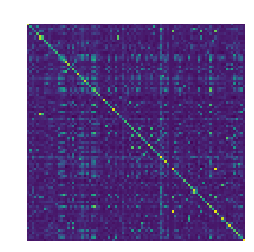

fc1000


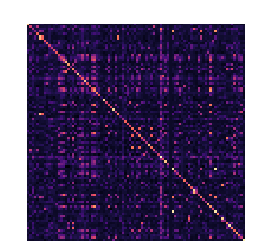

In [450]:
pool5_tag_sim = mp.cosine_similarity(pool5_predicted_tags.T, Y_test.T)
fc1000_tag_sim = mp.cosine_similarity(fc1000_predicted_tags.T, Y_test.T)

print(pool5_tag_sim.shape, fc1000_tag_sim.shape)
print()

print("pool5")
ax = plt.subplot()
ax.matshow(pool5_tag_sim, cmap = 'viridis')
plt.axis('off')
plt.show()

print("fc1000")
ax = plt.subplot()
ax.matshow(fc1000_tag_sim, cmap = 'magma')
plt.axis('off')
plt.show()

('furniture bed accessory backpack accessory suitcase accessory tie', 0)


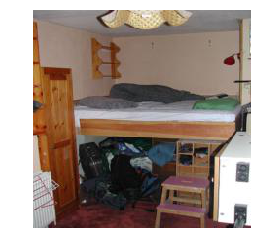

('animal cow', 1)


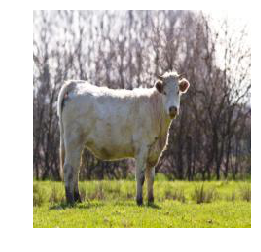

('vehicle boat person person accessory handbag', 56)


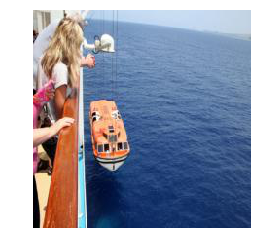

('furniture potted plant electronic tv person person electronic remote', 79)


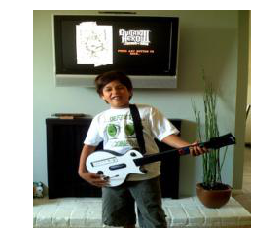

('animal cat furniture bed', 4)


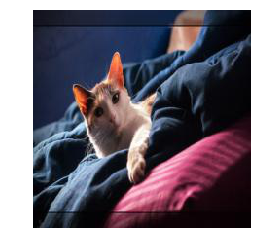

('kitchen bowl food broccoli kitchen cup', 5)


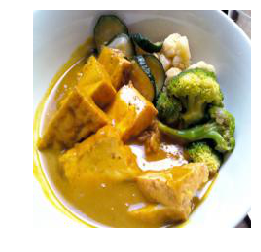

('kitchen bowl food broccoli kitchen cup', 5)


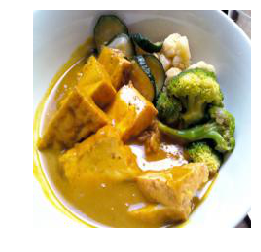

('food donut person person', 7)


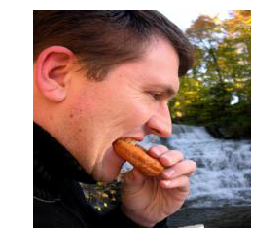

('furniture potted plant outdoor bench', 8)


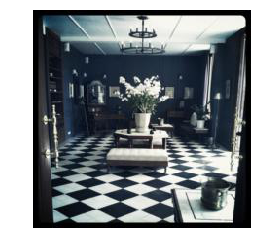

('animal cat furniture dining table indoor book', 9)


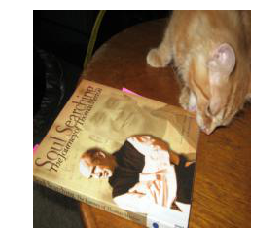

In [447]:
for s in range(10):
    t20 = np.argsort(pool5_tag_sim[s])[::-1][0:1]
    for r in t20:
        print(raw_test_tags[r])
        img = Image.open("./data/images_test/" + str(r) + ".jpg")
        img = np.asarray(img)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

('furniture bed accessory backpack accessory suitcase accessory tie', 0)


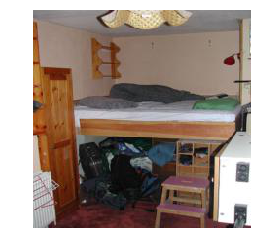

('animal cow', 1)


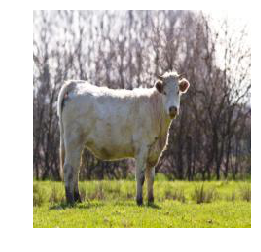

('vehicle boat person person accessory handbag', 56)


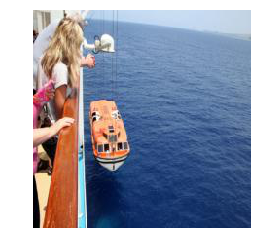

('furniture potted plant electronic tv person person electronic remote', 79)


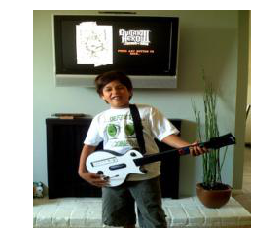

('animal cat furniture bed', 4)


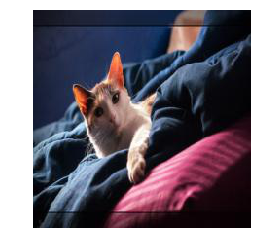

('kitchen bowl food broccoli kitchen cup', 5)


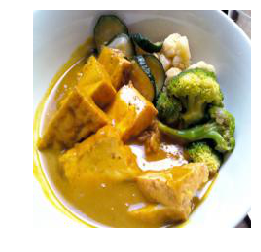

('kitchen bowl food broccoli kitchen cup', 5)


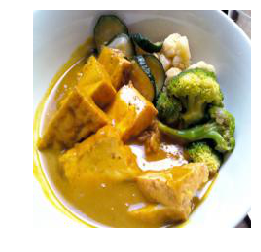

('food donut person person', 7)


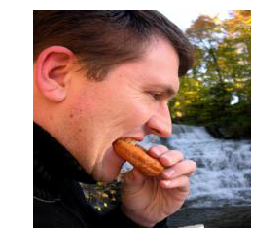

('furniture potted plant outdoor bench', 8)


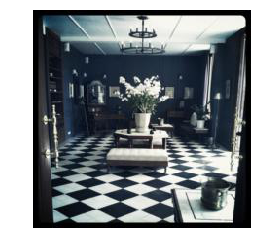

('animal cat furniture dining table indoor book', 9)


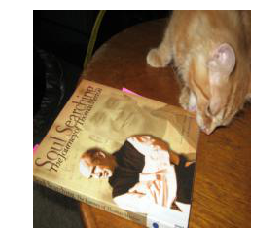

In [451]:
for s in range(10):
    t20 = np.argsort(fc1000_tag_sim[s])[::-1][0:1]
    for r in t20:
        print(raw_test_tags[r])
        img = Image.open("./data/images_test/" + str(r) + ".jpg")
        img = np.asarray(img)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [ ]:
# pls2_pool5.fit(resnet_train, X_train.toarray())

In [ ]:
# pls2_fc1000.fit(resnet_fc1000_train, Y_train.toarray())

In [372]:
pls2_all.fit(X_train.toarray(), Y_train.toarray())

PLSRegression(copy=True, max_iter=500, n_components=100, scale=True,
       tol=1e-06)

In [407]:
pls2_nouns.fit(X_train_nouns.toarray(), Y_train.toarray())

/Users/bielskic/anaconda3/lib/python3.6/site-packages/sklearn/cross_decomposition/pls_.py:77: UserWarning: Maximum number of iterations reached
  warnings.warn('Maximum number of iterations reached')


PLSRegression(copy=True, max_iter=500, n_components=100, scale=True,
       tol=1e-06)

In [398]:
pls2_all_resnet.fit(X_train.toarray(), resnet_train)

/Users/bielskic/anaconda3/lib/python3.6/site-packages/sklearn/cross_decomposition/pls_.py:77: UserWarning: Maximum number of iterations reached
  warnings.warn('Maximum number of iterations reached')


PLSRegression(copy=True, max_iter=500, n_components=100, scale=True,
       tol=1e-06)

In [378]:
pls2_nouns_resnet.fit(X_train_nouns.toarray(), resnet_fc1000_train)

PLSRegression(copy=True, max_iter=500, n_components=100, scale=True,
       tol=1e-06)

In [408]:
X_test_all_pred = pls2_all.predict(X_test.toarray())
X_test_nouns_pred = pls2_nouns.predict(X_test_nouns.toarray())
X_test_all_resnet_pred = pls2_all_resnet.predict(X_test.toarray())
X_test_nouns_resnet_pred = pls2_nouns_resnet.predict(X_test_nouns.toarray())

In [ ]:
### INSERT KFold CV ###
from sklearn import model_selection
kf = model_selection.KFold(n_splits = 5)
for train, test in kf.split(X):

In [418]:
test1 = X_test_all_pred * Y_test.T
test2 = X_test_nouns_pred * Y_test.T
# test = X_test_all_resnet_pred * np.matrix(resnet_test).T
# test = X_test_nouns_resnet_pred * np.matrix(resnet_fc1000_test).T
print(test.shape)

(2000, 2000)


In [400]:
test_sim = mp.cosine_similarity(X_test_all_pred.T, Y_test.T)

In [417]:
print(Y_test.shape, X_test_nouns_pred.shape)

(2000, 92) (2000, 92)


In [371]:
def load_descriptions(path):
    data = []
    for filename in glob.glob(os.path.join(path, "*.txt")):
        with open(filename, "r") as description_file:
            label = os.path.splitext(os.path.basename(filename))[0]
            sentence = " ".join(line.strip() for line in description_file)
            new_row = (sentence, label) 
            data.append(new_row)

    dt = np.dtype([('sentence', object), ('label', 'int64')])
    return(np.array(data, dtype = dt))

train_descriptions_path = "data/descriptions_train/"
test_descriptions_path = "data/descriptions_test/"

train_data = load_descriptions(train_descriptions_path)
test_data = load_descriptions(test_descriptions_path)

train_data.sort(order = 'label', axis = 0)
test_data.sort(order = 'label', axis = 0)

('A woman walking down a street past a doorway. a woman is walking past a doorway on a sidewalk A woman talking on a cell phone checks her watch. A woman talks on a cell phone and checks her watch while walking on a sidewalk. A woman wearing blue is on the phone and walking along a sidewalk in front of a building with black planters on both sides of the entrance.', 0)

('electronic cell phone vehicle car accessory handbag person person', 124)


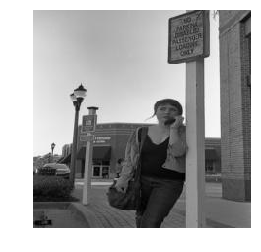

('electronic cell phone person person accessory handbag', 1862)


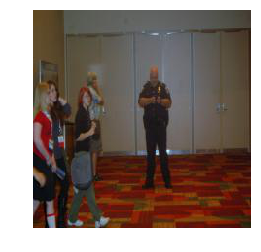

('electronic cell phone person person accessory handbag', 1698)


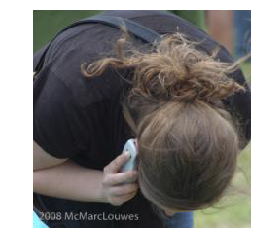

('electronic cell phone person person outdoor bench accessory handbag', 1479)


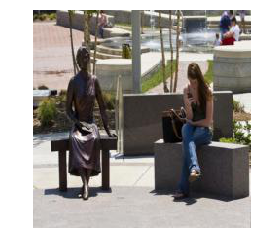

('electronic cell phone person person', 359)


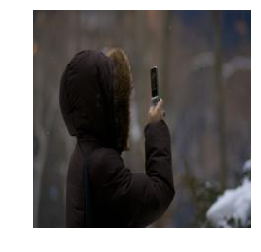

('electronic cell phone person person', 1231)


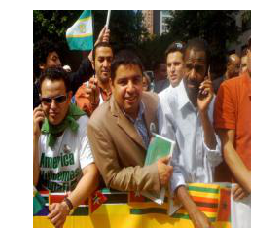

('electronic cell phone person person', 1131)


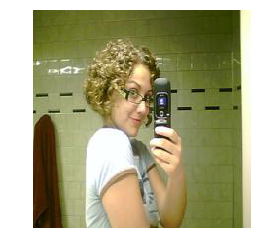

('person person electronic cell phone', 36)


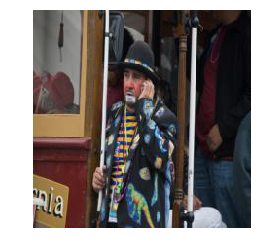

('electronic cell phone person person', 942)


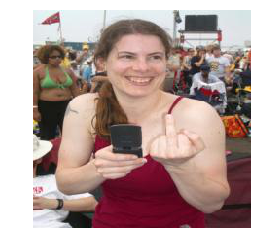

('electronic cell phone person person', 292)


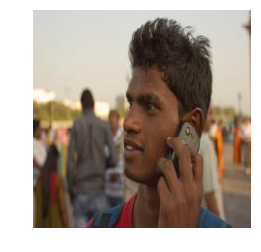

('electronic cell phone person person', 1743)


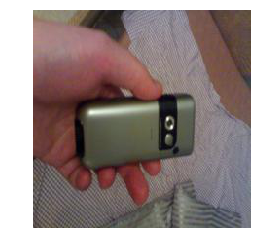

('electronic cell phone person person outdoor bench', 255)


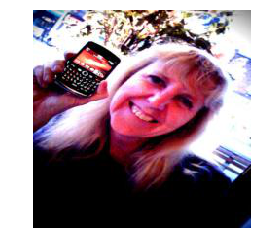

('electronic cell phone', 311)


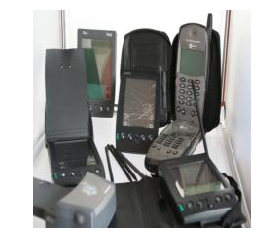

('electronic cell phone', 1086)


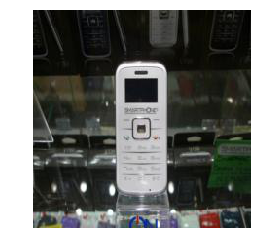

('electronic cell phone', 388)


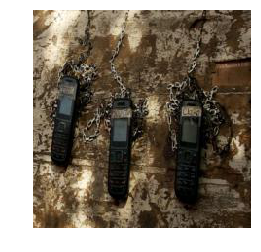

('electronic cell phone', 1343)


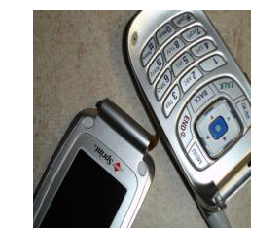

('electronic cell phone', 281)


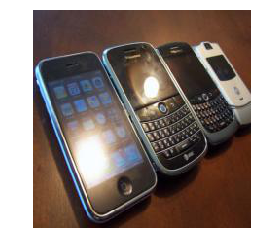

('electronic cell phone', 250)


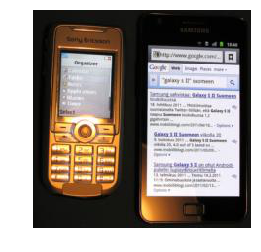

('electronic cell phone', 381)


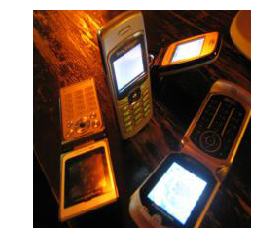

('electronic cell phone furniture chair person person', 949)


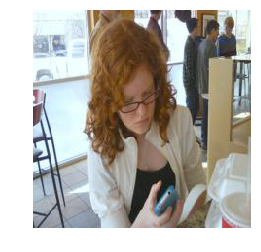

----------------------------------
('electronic cell phone person person', 359)


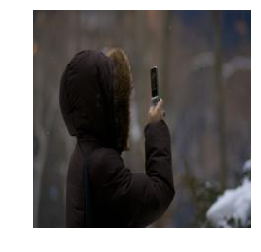

('person person electronic cell phone', 36)


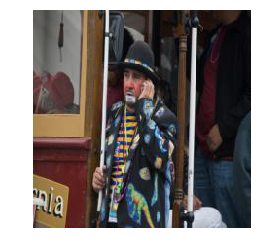

('electronic cell phone person person', 1231)


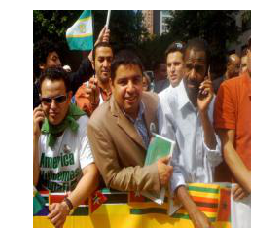

('electronic cell phone person person', 1131)


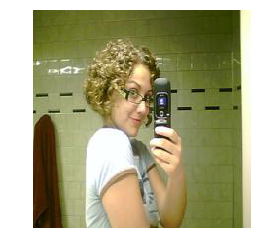

('electronic cell phone person person', 292)


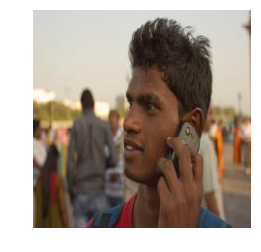

('electronic cell phone person person', 1743)


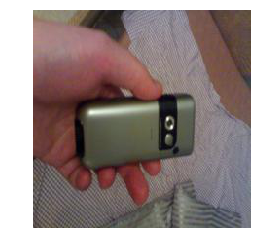

('electronic cell phone person person', 942)


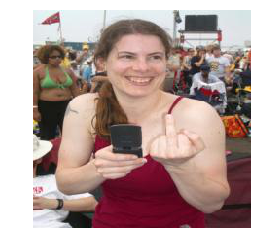

('electronic cell phone person person accessory handbag', 1862)


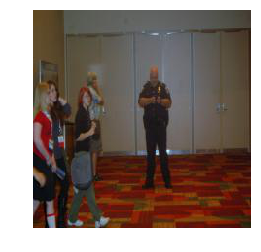

('electronic cell phone person person accessory handbag', 1698)


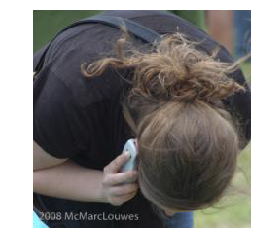

('electronic cell phone vehicle car accessory handbag person person', 124)


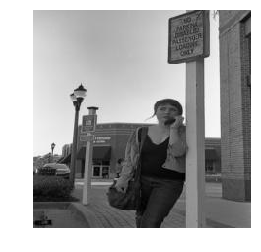

('electronic cell phone person person furniture chair', 1117)


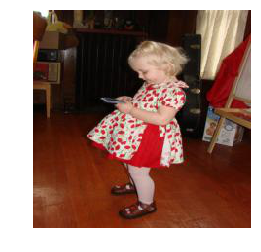

('electronic cell phone furniture chair person person', 949)


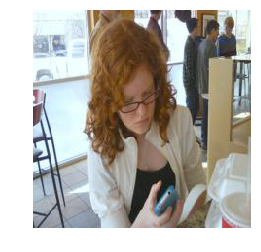

('electronic cell phone person person outdoor bench', 255)


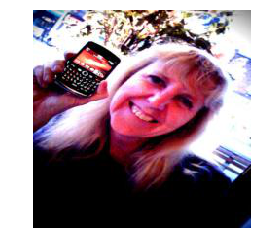

('electronic cell phone person person outdoor bench accessory handbag', 1479)


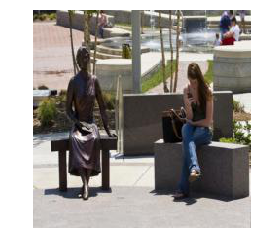

('electronic cell phone', 381)


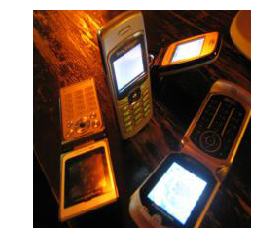

('electronic cell phone', 1086)


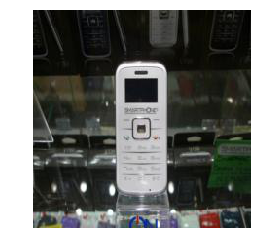

('electronic cell phone', 250)


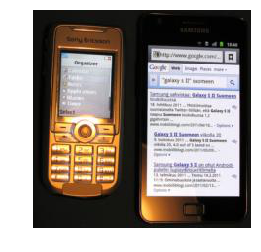

('electronic cell phone', 1343)


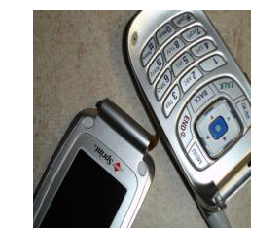

('electronic cell phone', 388)


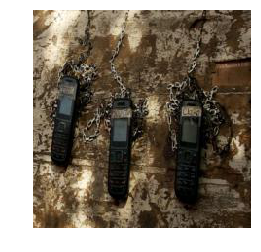

('electronic cell phone', 311)


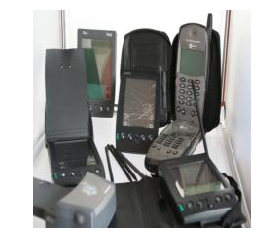

In [422]:
print(test_data[0])
print()

for i in np.argsort(test1[0])[::-1][0:20]:
    print(raw_test_tags[i])
    img = Image.open("./data/images_test/" + str(i) + ".jpg")
    img = np.asarray(img)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

print("----------------------------------")
print()
    
for ii in np.argsort(test2[0])[::-1][0:20]:
    print(raw_test_tags[ii])
    img = Image.open("./data/images_test/" + str(ii) + ".jpg")
    img = np.asarray(img)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

('A woman walking down a street past a doorway. a woman is walking past a doorway on a sidewalk A woman talking on a cell phone checks her watch. A woman talks on a cell phone and checks her watch while walking on a sidewalk. A woman wearing blue is on the phone and walking along a sidewalk in front of a building with black planters on both sides of the entrance.', 0)

('electronic cell phone vehicle car accessory handbag person person', 124)


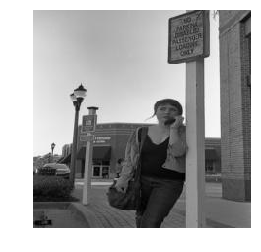

('electronic cell phone person person', 1231)


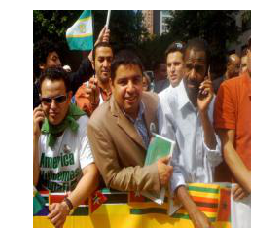

('electronic cell phone person person', 292)


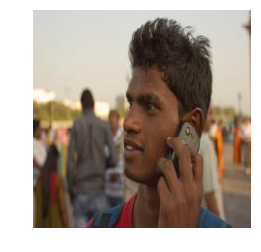

('electronic cell phone person person', 942)


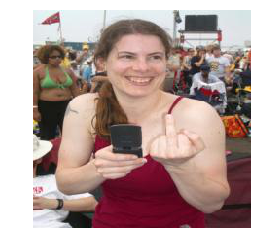

('person person electronic cell phone', 36)


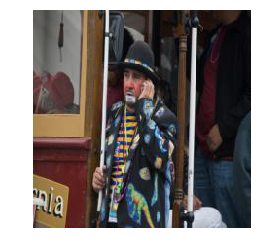

('electronic cell phone person person', 1743)


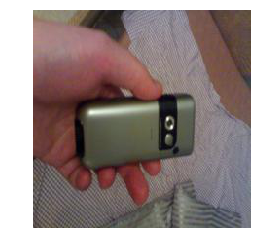

('electronic cell phone person person', 359)


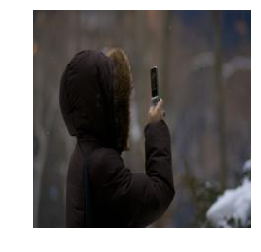

('electronic cell phone person person', 1131)


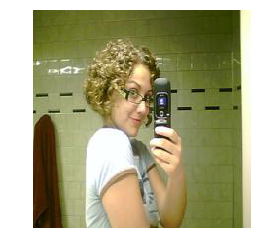

('electronic cell phone person person accessory handbag', 1698)


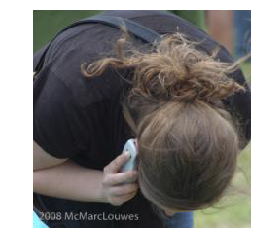

('electronic cell phone person person accessory handbag', 1862)


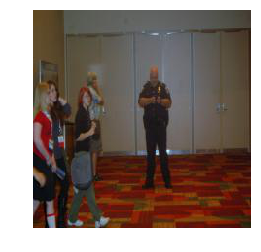

('A large slice of angel food cake sitting on top of a plate. A small plate contains a large slice of cake. A quarter of a cake on a plate A large piece of yellow cake sits on a plate. A large slab of sponge cake sits upon a flowery plate.', 1)

('kitchen fork food cake furniture dining table', 1907)


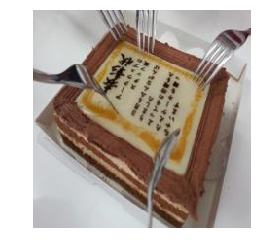

('furniture dining table kitchen fork food pizza', 314)


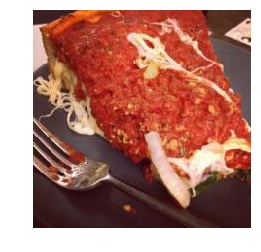

('kitchen fork kitchen knife kitchen bowl food pizza furniture dining table', 1999)


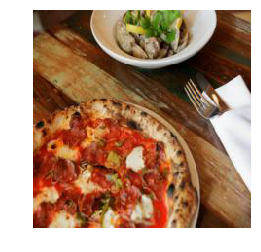

('kitchen fork kitchen knife food pizza kitchen bowl furniture dining table', 1114)


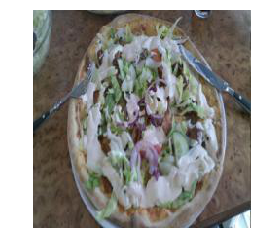

('kitchen cup food pizza kitchen fork kitchen knife furniture dining table', 1494)


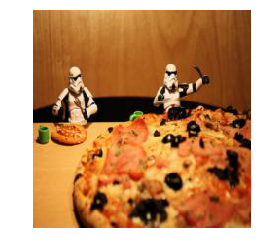

('kitchen cup kitchen fork food pizza kitchen knife furniture dining table', 1141)


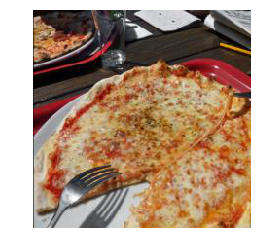

('furniture dining table kitchen knife food pizza kitchen cup kitchen fork', 1102)


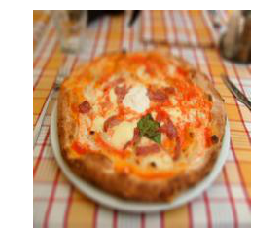

('furniture chair furniture dining table person person kitchen cup food pizza kitchen knife kitchen fork', 1516)


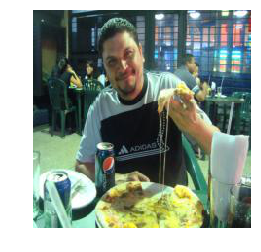

('kitchen bottle furniture chair furniture dining table person person kitchen cup food pizza kitchen fork kitchen knife kitchen bowl', 789)


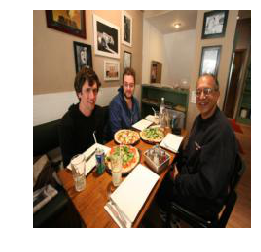

('food cake furniture dining table', 589)


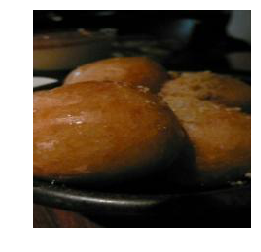

('A group of traffic lights sitting above an intersection. The sign shining down over the street lights A picture of a stoplight from a window. The sun surrounded by an airplane and traffic lights Several street lights and an airplane flying overhead.', 2)

('vehicle airplane outdoor traffic light', 598)


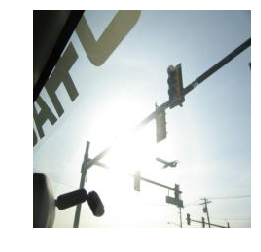

('vehicle car outdoor traffic light', 159)


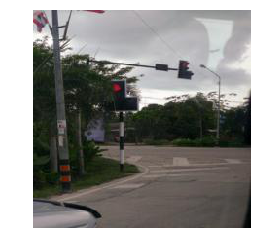

('vehicle car outdoor traffic light', 1713)


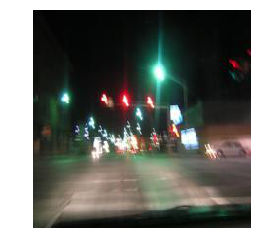

('vehicle car outdoor traffic light', 720)


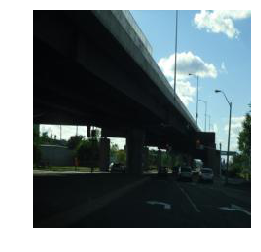

('vehicle car outdoor traffic light', 953)


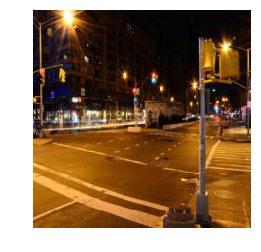

('vehicle car outdoor traffic light', 1955)


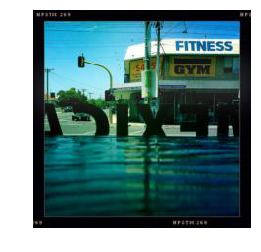

('vehicle car outdoor traffic light', 1107)


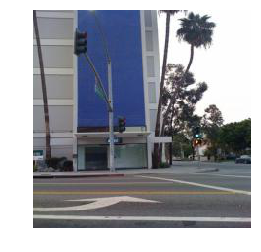

('vehicle car person person outdoor traffic light', 1366)


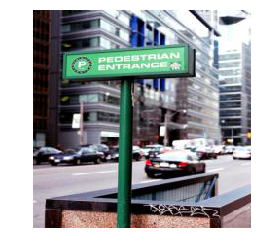

('outdoor traffic light', 1866)


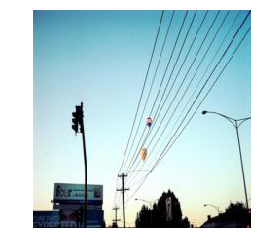

('outdoor traffic light', 184)


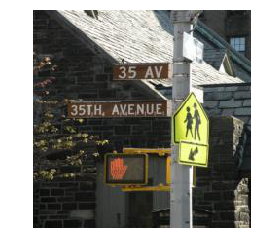

('Two mean in uniform are riding horses side by side on a sandy beach. Two police officers on horses riding on the beach. two people riding on horses in the middle of a lot A pair of police officers ride on horses down the beach. Two people in neon vests riding horses down the beach.', 3)

('animal horse person person', 1865)


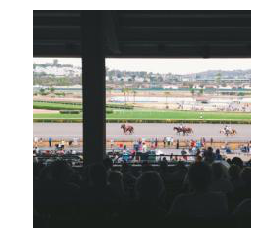

('animal horse person person', 75)


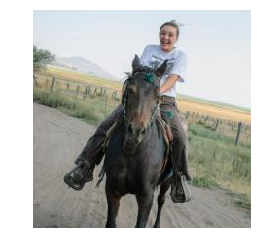

('animal horse accessory handbag person person', 1716)


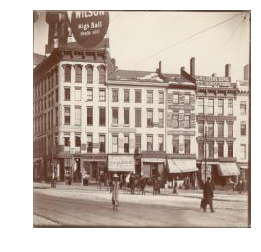

('animal horse person person', 1922)


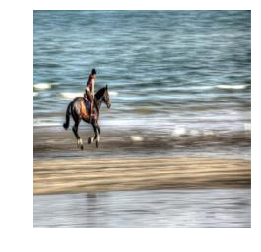

('animal horse person person', 799)


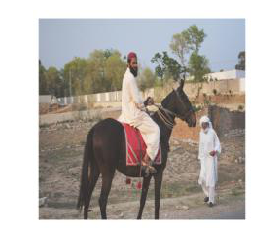

('animal horse person person', 836)


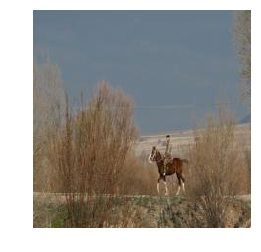

('animal horse person person', 1513)


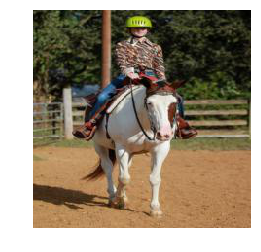

('animal horse person person', 654)


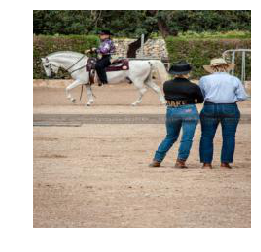

('animal horse person person', 800)


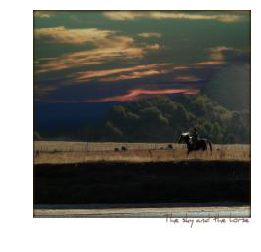

('animal horse person person', 1486)


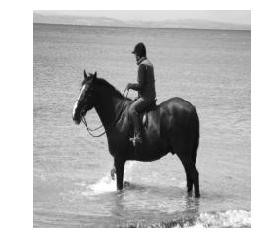

('Man and woman using pay phones at adjacent booths. Adults using pay telephones outdoors while standing next to soda machine. A couple of people on phones standing together. A man and woman are talking on public pay phones. a couple of people that are talking on a phone', 4)

('electronic cell phone vehicle car accessory handbag person person', 124)


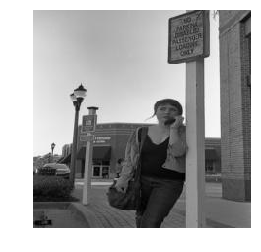

('electronic cell phone person person accessory handbag', 1698)


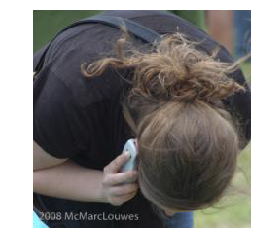

('electronic cell phone person person accessory handbag', 1862)


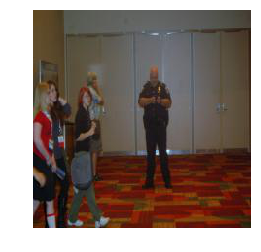

('electronic cell phone person person outdoor bench accessory handbag', 1479)


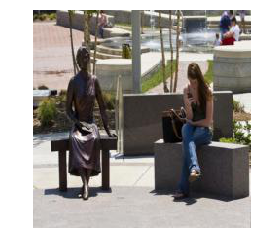

('vehicle car outdoor parking meter person person vehicle truck electronic cell phone', 231)


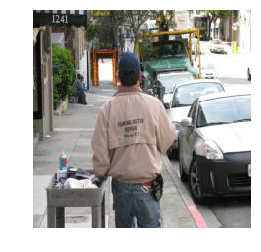

('electronic cell phone furniture chair person person', 949)


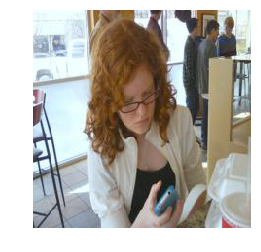

('electronic cell phone person person furniture chair', 1117)


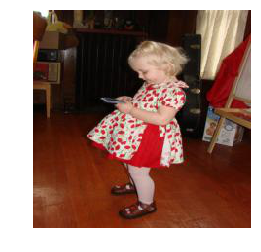

('electronic cell phone person person', 1743)


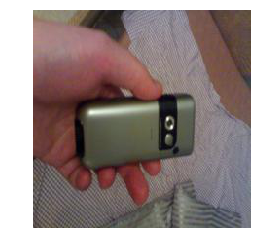

('electronic cell phone person person', 1131)


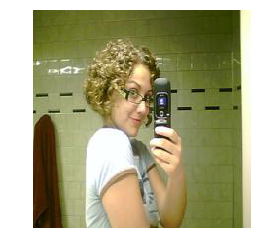

('electronic cell phone person person', 942)


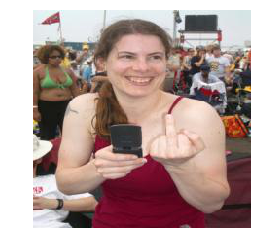

('a man is doing a trick on a skateboard A skateboarder doing a trick in the air, on a wooden ramp with a blue sky and clouds in the background. A person is performing a trick on a skateboard. there is a skateboarder that has jumped on to a ramp A man is jumping on a skateboard in a park.', 5)

('person person sports skateboard', 51)


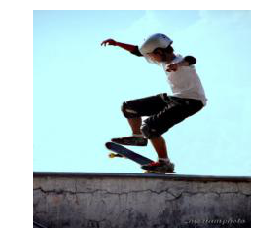

('person person sports skateboard', 1693)


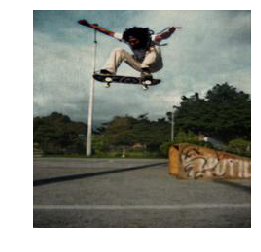

('person person sports skateboard', 814)


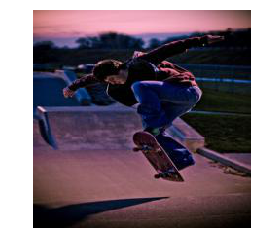

('person person sports kite sports skateboard', 1097)


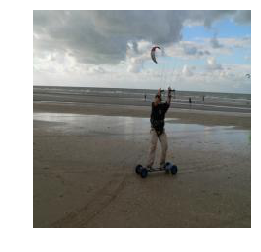

('person person sports skateboard', 1895)


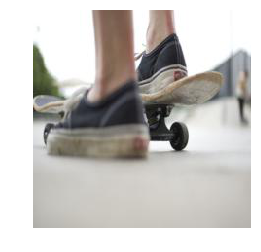

('person person sports skateboard', 1426)


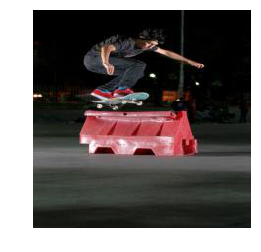

('person person sports skateboard', 1968)


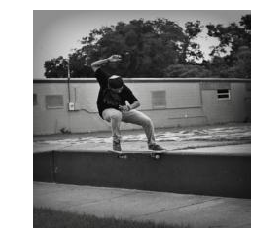

('person person sports skateboard', 887)


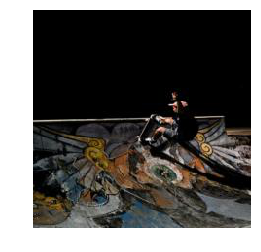

('person person sports skateboard', 330)


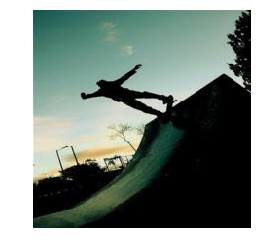

('person person sports skateboard', 492)


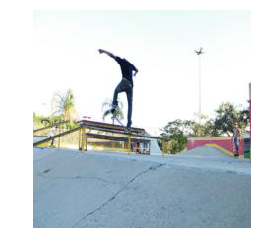

('A person on skis is in the air. There is a person jumping in the air on a pair of skis. The person gets airborne while skiing down the slope. The skier is doing a trick in the air. A skier is mid air on the slopes.', 6)

('person person sports skis', 1151)


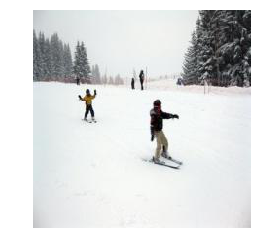

('person person sports skis', 1625)


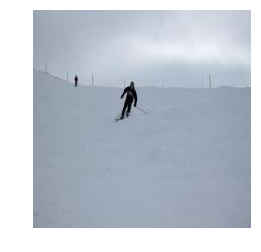

('person person sports skis', 1815)


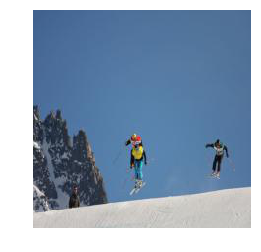

('person person sports skis', 1758)


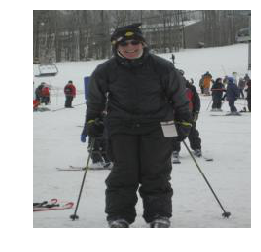

('person person sports skis', 217)


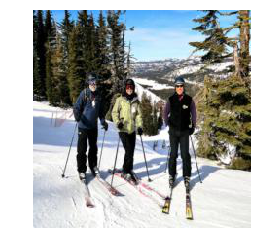

('person person sports skis', 156)


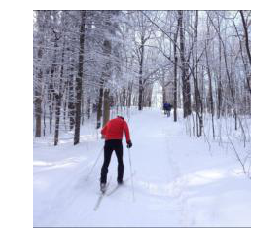

('person person sports skis', 486)


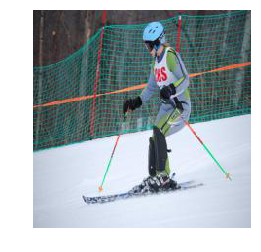

('person person sports skis', 358)


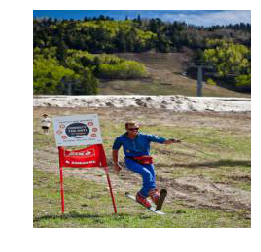

('person person sports skis', 402)


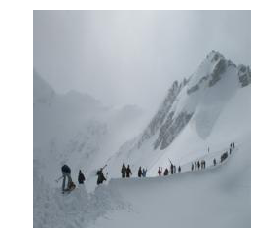

('sports skis person person', 1607)


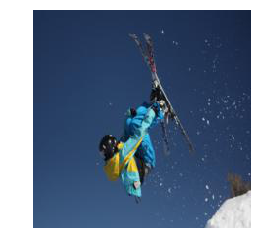

('A man standing next to a zebra on a lawn. a guy showing off a zebra at a building A young man poses next to a zebra in a grassy wildlife exhibit. A man standing next to  zebra on the grass A man standing next to a zebra gesturing toward it.', 7)

('animal zebra', 627)


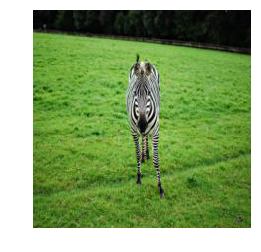

('animal zebra', 481)


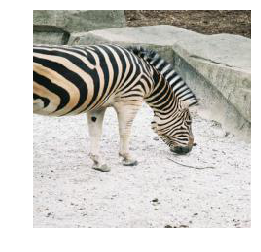

('animal zebra', 528)


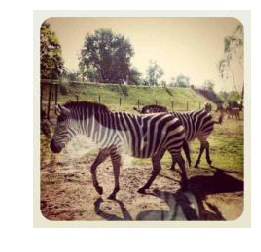

('animal zebra', 1155)


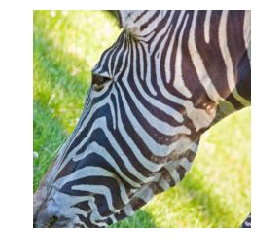

('animal zebra', 1249)


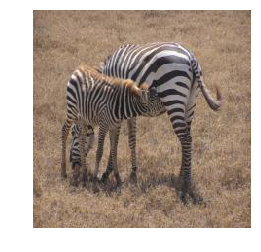

('animal zebra', 168)


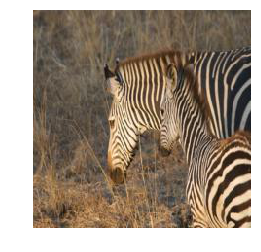

('animal zebra', 756)


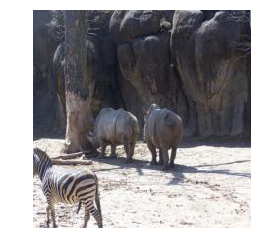

('animal zebra', 1239)


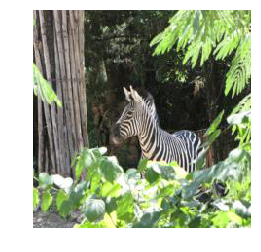

('animal zebra', 136)


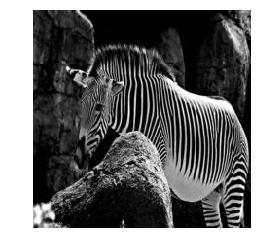

('animal zebra', 1328)


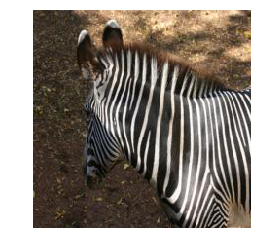

('an orange fire truck parked in a wharehouse An antique truck displayed in a work garage. A red fire engine is parked in the fire station. A red fire engine is inside of a building. The old model fire truck sat alone in the room.', 8)

('outdoor fire hydrant person person vehicle truck', 1037)


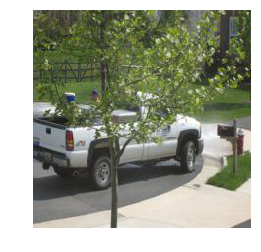

('outdoor fire hydrant person person accessory backpack vehicle car vehicle truck', 114)


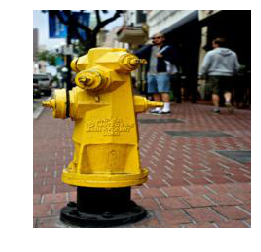

('vehicle car person person vehicle bus outdoor fire hydrant vehicle truck', 260)


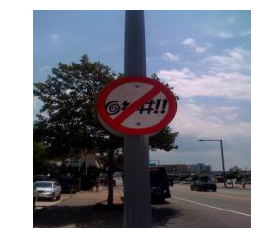

('outdoor fire hydrant person person', 1556)


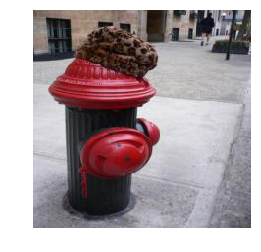

('outdoor fire hydrant vehicle car', 372)


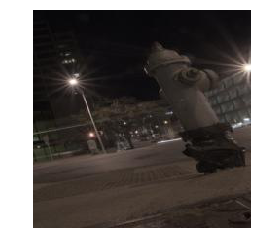

('vehicle car outdoor fire hydrant', 1987)


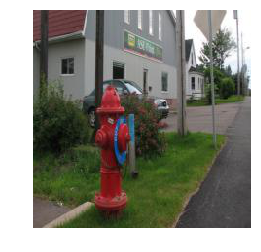

('outdoor fire hydrant vehicle car', 1717)


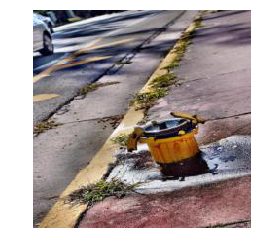

('vehicle car outdoor fire hydrant', 813)


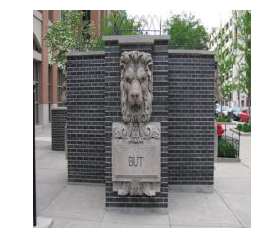

('vehicle car outdoor fire hydrant', 561)


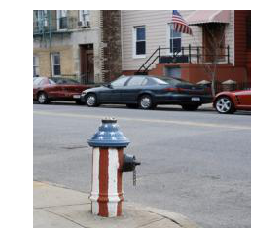

('outdoor fire hydrant', 1833)


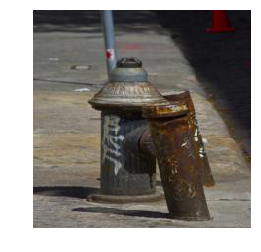

('A few people that are standing with skateboards. A group of skateboarders standing at the top of a ramp with their skateboards resting against the top of the ramp. There are four boys standing at the ready with their skateboards. Four skateboarders stand at the top of a ramp, with their boards, ready to skate. some guys standing on top of ramp with their skateboads', 9)

('person person sports skateboard', 46)


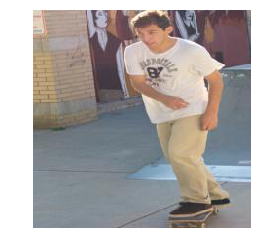

('person person sports skateboard', 1761)


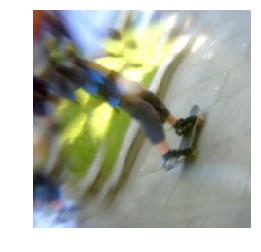

('person person sports skateboard', 703)


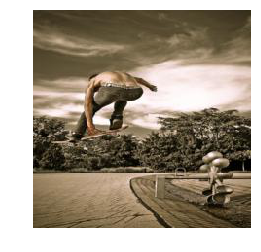

('person person sports skateboard', 1830)


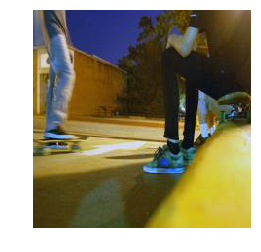

('person person sports skateboard', 614)


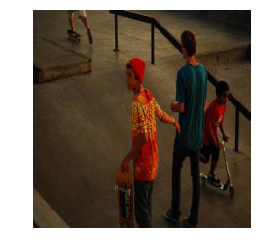

('person person sports skateboard', 814)


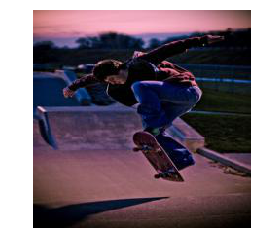

('person person sports skateboard', 330)


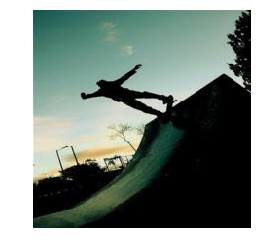

('person person sports skateboard', 1968)


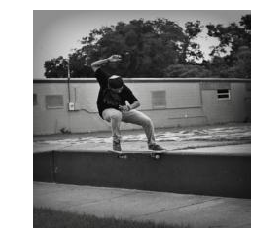

('person person sports kite sports skateboard', 1097)


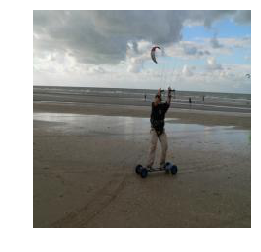

('person person sports skateboard', 1895)


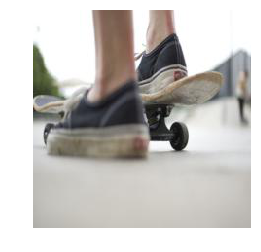

In [424]:
merged_test = (test1 + test2)/2
for i in (range(10)):
    print(test_data[i])
    print()
    for j in np.argsort(merged_test[i])[::-1][0:10]:
        print(raw_test_tags[j])
        img = Image.open("./data/images_test/" + str(j) + ".jpg")
        img = np.asarray(img)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [426]:
with open('output/merged_plsr_tags.txt', 'w') as f:
    for i in range(0, X_test.shape[0]):
        row = " ".join([str(img) + ".jpg" for img in np.argsort(merged_test[i])[::-1][0:20]])
        row = str(i) + ".txt," + row
        f.write("%s\n" % row)